# Overview

## What is MMDetection

![MMDetection](https://user-images.githubusercontent.com/12907710/137271636-56ba1cd2-b110-4812-8221-b4c120320aa9.png)

MMDetection is an object detection toolbox that contains a rich set of object detection, instance segmentation, and panoptic segmentation methods as well as related components and modules, and below is its whole framework:

MMDetection consists of 7 main parts, apis, structures, datasets, models, engine, evaluation and visualization.

* **apis** provides high-level APIs for model inference.
* **structures** provides data structures like ``bbox``, ``mask``, and ``DetDataSample``.
* **datasets** supports various dataset for ``object detection``, ``instance segmentation``, and ``panoptic segmentation``.
    * ***transforms** contains a lot of useful data augmentation transforms.
    * **samplers** defines different data loader sampling strategy.
* **models** is the most vital part for detectors and contains different components of a detector.
    * **detectors** defines all of the detection model classes.
    * **data_preprocessors** is for preprocessing the input data of the model.
    * **backbones** contains various ``backbone`` networks.
    * **necks** contains various ``neck`` components.
    * **dense_heads** contains various detection ``heads that perform dense predictions``.
    * **roi_heads** contains various detection ``heads that predict from RoIs``.
    * **seg_heads** contains various ``segmentation heads``.
    * **losses** contains various loss functions.
    * **task_modules** provides modules for detection tasks. E.g. ``assigners``, ``samplers``, ``box coders``, and ``prior generators``.
    * **layers** provides some basic neural network layers.
* **engine** is a part for runtime components.
    * **runner** provides extensions for MMEngine’s runner.
    * **schedulers** provides schedulers for adjusting optimization hyperparameters.
    * **optimizers** provides optimizers and optimizer wrappers.
    * **hooks** provides various ``hooks`` of the runner.
* **evaluation** provides different metrics for evaluating model performance.
    * **metrics** contains different evaluation metrics.
    * **evaluators** provides evaluators for dataset evaluation.
* **visualization** is for visualizing detection results.

## Get Started

### Installation

Bu proje Windows üzerinde **CUDA 12.1** ve **PyTorch 2.1.2** kullanılarak başarıyla test edilmiştir. Derleme hatalarından kaçınmak için aşağıdaki sürüm kombinasyonlarını kullanın.

**Gereksinimler:**
* Anaconda veya Miniconda
* NVIDIA GPU (Sürücüler güncel olmalı)

### Adım Adım Kurulum Komutları

**1. Anaconda Prompt içinde yeni bir ortam oluşturun (Python 3.8 önerilir):**
```bash
conda create --name openmmlab python=3.8 -y
conda activate openmmlab
```

**2. PyTorch'u yükleyin (Versiyon 2.1.2 - Kritik Adım!):**
>En yeni sürümü yüklemeyin, uyumluluk için bu sürüm şart.

```bash
pip install torch==2.1.2 torchvision==0.16.2 --index-url [https://download.pytorch.org/whl/cu121](https://download.pytorch.org/whl/cu121)
```

**3. OpenMIM ve MMEngine araçlarını kurun:**

```bash
pip install -U openmim
mim install mmengine
```

**4. MMCV'yi kurun (Versiyon 2.1.0):**
>PyTorch 2.1.2 ile tam uyumlu olan ve Windows'ta derleme hatası vermeyen sürüm budur.

```bash
mim install "mmcv==2.1.0"
```

**5. MMDetection'ı kurun:**

```bash
mim install mmdet
```

## `DetInferencer`

### Basic Usage

We use the high-level API `DetInferencer` implemented in the MMDetection. This API is created to ease the inference process. The details of the codes can be found [here](https://github.com/open-mmlab/mmdetection/blob/dev-3.x/mmdet/apis/det_inferencer.py).

In [2]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: win32
Python: 3.8.20 (default, Oct  3 2024, 15:19:54) [MSC v.1929 64 bit (AMD64)]
CUDA available: True
MUSA available: False
numpy_random_seed: 2147483648
GPU 0: NVIDIA GeForce RTX 3050 Ti Laptop GPU
CUDA_HOME: None
GCC: n/a
PyTorch: 2.1.2+cu121
PyTorch compiling details: PyTorch built with:
  - C++ Version: 199711
  - MSVC 192930151
  - Intel(R) Math Kernel Library Version 2020.0.2 Product Build 20200624 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 2019
  - LAPACK is enabled (usually provided by MKL)
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_61,code=sm_61;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-gencode;arch=compute_86,code=sm_86;-gencode;arch=compute_90,code=sm_90
  - CuDNN 8.8.1  (b

### 1. Initialize the DetInferencer

DetInferencer'ı başlatmak için sadece **model adı** yeterli. Weights otomatik indirilecek.

In [5]:
# Import DetInferencer
from mmdet.apis import DetInferencer

# Initialize the DetInferencer with RTMDet-tiny model
# Weights will be automatically downloaded
inferencer = DetInferencer(model='rtmdet_tiny_8xb32-300e_coco', device='cuda:0')

print("✓ Model yüklendi!")
print(inferencer)

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

✓ Model yüklendi!


c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


### 2. Prepare a demo image

Orijinal demo notebook'taki `demo/demo.jpg` görseli için internetten indireceğiz.

In [7]:
import urllib.request
from pathlib import Path

# Create demo directory
demo_dir = Path('demo')
demo_dir.mkdir(exist_ok=True)

# Download demo image from MMDetection repository
img_url = 'https://raw.githubusercontent.com/open-mmlab/mmdetection/main/demo/demo.jpg'
img_path = demo_dir / 'test_images/demo.jpg'
# img_url = 'https://raw.githubusercontent.com/open-mmlab/mmdetection/main/demo/large_image.jpg'
# img_path = demo_dir / 'test_images/large_image.jpg'



if not img_path.exists():
    print("Downloading demo image...")
    urllib.request.urlretrieve(img_url, img_path)
    print(f"✓ Image downloaded: {img_path}")
else:
    print(f"✓ Image already exists: {img_path}")

img = str(img_path)

✓ Image downloaded: demo\test_images\demo.jpg


### 3. Perform inference

Orijinal notebook'taki gibi - sadece görsel yolunu veriyoruz, `show=True` ile sonucu gösteriyoruz.

In [8]:
# Perform inference
# show=True VSCode'da çalışmayabilir, bu yüzden out_dir kullanıyoruz
result = inferencer(img, show=False, out_dir='demo/outputs')

print("✓ Inference completed!")
print(f"Results saved to: demo/outputs")

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in
an upcoming release, it will be required to pass the indexing argument. (Triggered internally at 
C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

✓ Inference completed!
Results saved to: demo/outputs


### 4. Visualize the results

Sonucu notebook'ta gösterelim.

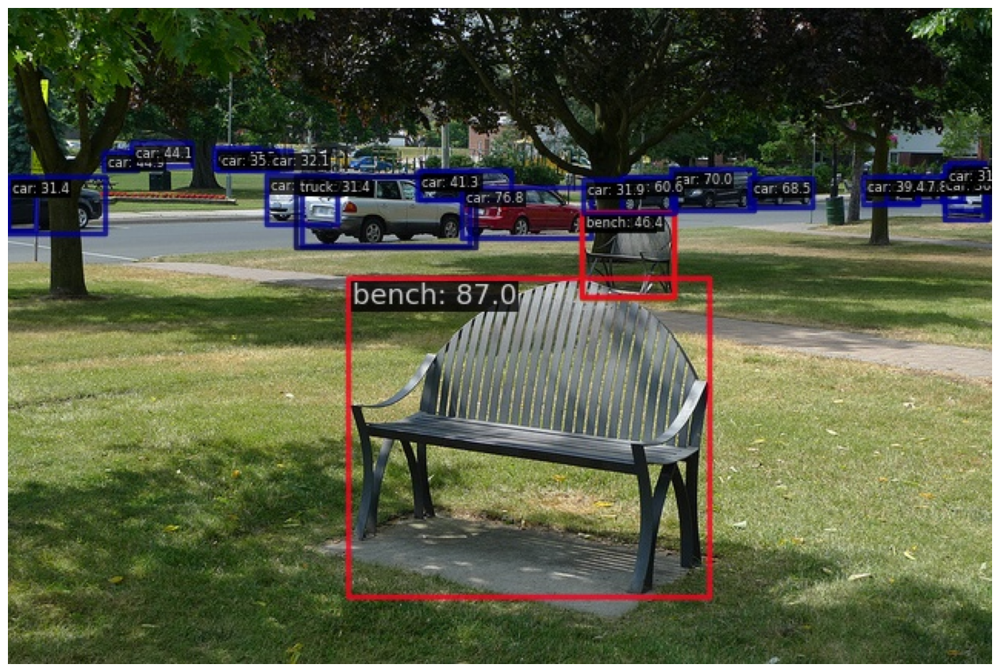

In [9]:
from PIL import Image
import matplotlib.pyplot as plt

# Prediction result path
out_img = 'demo/outputs/vis/demo.jpg'

# Show image
plt.figure(figsize=(16, 11))
plt.imshow(Image.open(out_img))
plt.axis('off')  # Hide axes
plt.show()

---

## Bölüm 2: Comprehensive Model Testing

Şimdi **6 farklı model** ile **6 farklı görsel** test edeceğiz. Bu sayede:
- Hangi modelin hangi senaryoda daha iyi olduğunu göreceğiz
- Farklı nesne tiplerinde performans farkını anlayacağız
- MMDetection'ın esnekliğini öğreneceğiz

**Test Planı:**
- 📸 6 Görsel: demo.jpg, large_image.jpg, street, kitchen, animals, sports
- 🤖 6 Model: RTMDet (tiny/s/l), Faster R-CNN, Mask R-CNN, RetinaNet
- 📊 Toplam: 36 inference sonucu

### Step 1: Prepare 6 Test Images

Farklı senaryoları kapsayan 6 görsel indireceğiz.

In [11]:
import urllib.request
from pathlib import Path
from PIL import Image
import io

# Test klasörü
test_dir = Path('demo/test_images')
test_dir.mkdir(parents=True, exist_ok=True)

# 6 test görseli
test_images = {
    'demo': 'https://raw.githubusercontent.com/open-mmlab/mmdetection/main/demo/demo.jpg',
    'large_image': 'https://raw.githubusercontent.com/open-mmlab/mmdetection/main/demo/large_image.jpg',
    'street': 'https://images.unsplash.com/photo-1449824913935-59a10b8d2000?w=800',      # Şehir, arabalar, insanlar
    'kitchen': 'https://images.unsplash.com/photo-1556911220-bff31c812dba?w=800',       # Mutfak eşyaları
    'animals': 'https://images.unsplash.com/photo-1552728089-57bdde30beb3?w=800',       # Papağan
    'sports': 'https://images.unsplash.com/photo-1546519638-68e109498ffc?w=800',        # Basketbol topu ve potası
}

# İndir - PIL ile açıp düzgün JPEG olarak kaydet
print("Downloading test images...")
for name, url in test_images.items():
    img_path = test_dir / f'{name}.jpg'
    if not img_path.exists():
        try:
            # URL'den veriyi oku
            with urllib.request.urlopen(url) as response:
                img_data = response.read()
            
            # PIL ile aç ve düzgün JPEG olarak kaydet
            img = Image.open(io.BytesIO(img_data))
            # RGB'ye çevir (alpha channel varsa)
            if img.mode in ('RGBA', 'LA', 'P'):
                img = img.convert('RGB')
            # JPEG olarak kaydet
            img.save(img_path, 'JPEG', quality=95)
            print(f"  ✓ {name}.jpg")
        except Exception as e:
            print(f"  ✗ {name}.jpg - Error: {e}")
    else:
        print(f"  ✓ {name}.jpg (already exists)")

print(f"\n✓ Total images ready: {len(list(test_dir.glob('*.jpg')))}")

  ✓ demo.jpg (already exists)
  ✓ large_image.jpg (already exists)
  ✓ street.jpg (already exists)
  ✓ kitchen.jpg (already exists)
  ✓ animals.jpg
  ✓ sports.jpg

✓ Total images ready: 6


### Step 2: Define 6 Models to Test

Farklı mimarileri temsil eden 6 model seçeceğiz.

In [12]:
# 6 farklı model
models = {
    'RTMDet-tiny': 'rtmdet_tiny_8xb32-300e_coco',       # En hızlı
    'RTMDet-small': 'rtmdet_s_8xb32-300e_coco',         # Dengeli
    'RTMDet-large': 'rtmdet_l_8xb32-300e_coco',         # En doğru RTMDet
    'Faster-RCNN': 'faster-rcnn_r50_fpn_1x_coco',       # Klasik two-stage
    'Mask-RCNN': 'mask-rcnn_r50_fpn_1x_coco',           # Instance segmentation
    'RetinaNet': 'retinanet_r50_fpn_1x_coco',           # Single-stage with focal loss
}

print("Models to test:")
for i, (name, config) in enumerate(models.items(), 1):
    print(f"  {i}. {name:15s} - {config}")

Models to test:
  1. RTMDet-tiny     - rtmdet_tiny_8xb32-300e_coco
  2. RTMDet-small    - rtmdet_s_8xb32-300e_coco
  3. RTMDet-large    - rtmdet_l_8xb32-300e_coco
  4. Faster-RCNN     - faster-rcnn_r50_fpn_1x_coco
  5. Mask-RCNN       - mask-rcnn_r50_fpn_1x_coco
  6. RetinaNet       - retinanet_r50_fpn_1x_coco


### Step 3: Run All Combinations (6 Models × 6 Images = 36 Tests)

Tüm kombinasyonları çalıştıracağız. Bu işlem biraz sürebilir (~5-10 dakika).

In [13]:
import time
from pathlib import Path

# Test görselleri klasörü
test_dir = Path('demo/test_images')

# Sonuçları organize etmek için output klasörü
output_base = Path('demo/outputs')
output_base.mkdir(parents=True, exist_ok=True)

# Tüm kombinasyonları çalıştır
results = []
print("Starting comprehensive testing...")
print(f"Total tests: {len(models)} models × {len(test_images)} images = {len(models) * len(test_images)} tests\n")

for model_name, model_config in models.items():
    print(f"\n{'='*60}")
    print(f"Testing Model: {model_name}")
    print(f"{'='*60}")
    
    # Model'i yükle
    try:
        inferencer = DetInferencer(model_config)
        print(f"✓ Model loaded successfully")
    except Exception as e:
        print(f"✗ Failed to load model: {e}")
        continue
    
    for img_name, img_url in test_images.items():
        try:
            start_time = time.time()

            # Lokal dosya yolunu oluştur
            img_path = str(test_dir / f'{img_name}.jpg')
            
            # Inference yap
            # Her kombinasyon için ayrı output klasörü
            out_dir = output_base / model_name / img_name
            out_dir.mkdir(parents=True, exist_ok=True)
            
            result = inferencer(
                img_path,
                out_dir=str(out_dir),
                no_save_vis=False,  # Görselleştirmeyi kaydet
                no_save_pred=False  # Tahminleri kaydet
            )
            
            inference_time = time.time() - start_time
            
            # Sonuçları kaydet
            num_detections = len(result['predictions'][0]['labels'])
            results.append({
                'model': model_name,
                'image': img_name,
                'num_detections': num_detections,
                'inference_time': inference_time,
                'output_dir': str(out_dir)
            })
            
            print(f"  ✓ {img_name}: {num_detections} objects detected in {inference_time:.2f}s")
            
        except Exception as e:
            print(f"  ✗ {img_name}: Failed - {e}")
            results.append({
                'model': model_name,
                'image': img_name,
                'error': str(e)
            })

print("\n" + "="*60)
print("All tests completed!")
print("="*60)

Starting comprehensive testing...
Total tests: 6 models × 6 images = 36 tests


Testing Model: RTMDet-tiny
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

✓ Model loaded successfully


  ✓ demo: 300 objects detected in 0.36s


c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:760: UserWarning: 
Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:831: UserWarning: 
Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  ✓ large_image: 300 objects detected in 0.30s


  ✓ street: 300 objects detected in 0.24s


  ✓ kitchen: 300 objects detected in 0.25s


  ✓ animals: 300 objects detected in 0.25s


  ✓ sports: 300 objects detected in 0.32s

Testing Model: RTMDet-small
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_s_8xb32-300e_coco/rtmdet_s_8xb32-300e_coco_20220905_161602-387a891e.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

✓ Model loaded successfully


  ✓ demo: 300 objects detected in 0.38s


  ✓ large_image: 300 objects detected in 0.36s


  ✓ street: 300 objects detected in 0.25s


  ✓ kitchen: 300 objects detected in 0.23s


  ✓ animals: 300 objects detected in 0.23s


  ✓ sports: 300 objects detected in 0.19s

Testing Model: RTMDet-large
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_l_8xb32-300e_coco/rtmdet_l_8xb32-300e_coco_20220719_112030-5a0be7c4.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

✓ Model loaded successfully


  ✓ demo: 300 objects detected in 0.43s


  ✓ large_image: 300 objects detected in 0.33s


  ✓ street: 300 objects detected in 0.27s


  ✓ kitchen: 300 objects detected in 0.26s


  ✓ animals: 300 objects detected in 0.26s


  ✓ sports: 300 objects detected in 0.22s

Testing Model: Faster-RCNN
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth
✓ Model loaded successfully


  ✓ demo: 57 objects detected in 0.33s


  ✓ large_image: 97 objects detected in 0.36s


  ✓ street: 88 objects detected in 0.44s


  ✓ kitchen: 92 objects detected in 0.31s


  ✓ animals: 2 objects detected in 0.32s


  ✓ sports: 17 objects detected in 0.27s

Testing Model: Mask-RCNN
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_fpn_1x_coco/mask_rcnn_r50_fpn_1x_coco_20200205-d4b0c5d6.pth
✓ Model loaded successfully


  ✓ demo: 66 objects detected in 0.52s


  ✓ large_image: 94 objects detected in 1.39s


  ✓ street: 91 objects detected in 0.86s


  ✓ kitchen: 93 objects detected in 0.65s


  ✓ animals: 3 objects detected in 0.36s


  ✓ sports: 13 objects detected in 0.30s

Testing Model: RetinaNet
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v2.0/retinanet/retinanet_r50_fpn_1x_coco/retinanet_r50_fpn_1x_coco_20200130-c2398f9e.pth
✓ Model loaded successfully


  ✓ demo: 100 objects detected in 0.24s


  ✓ large_image: 100 objects detected in 0.35s


  ✓ street: 100 objects detected in 0.30s


  ✓ kitchen: 100 objects detected in 0.28s


  ✓ animals: 18 objects detected in 0.25s


  ✓ sports: 100 objects detected in 0.27s

All tests completed!


### Step 4: Analyze Results

Sonuçları görselleştirelim ve karşılaştıralım.

Successful Tests: 36
Failed Tests: 0


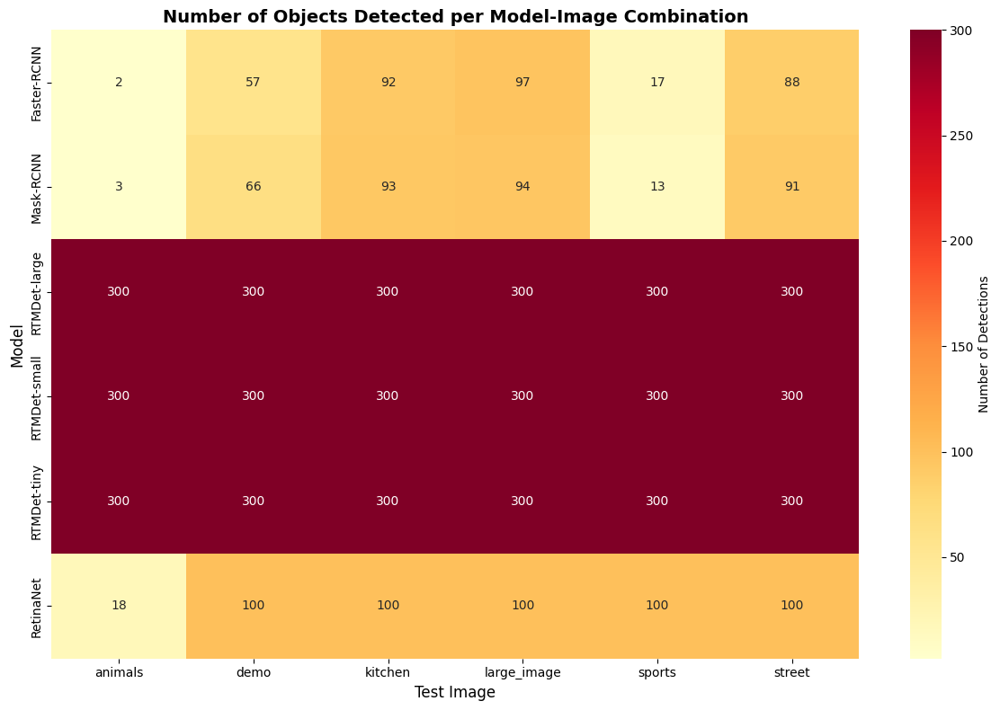

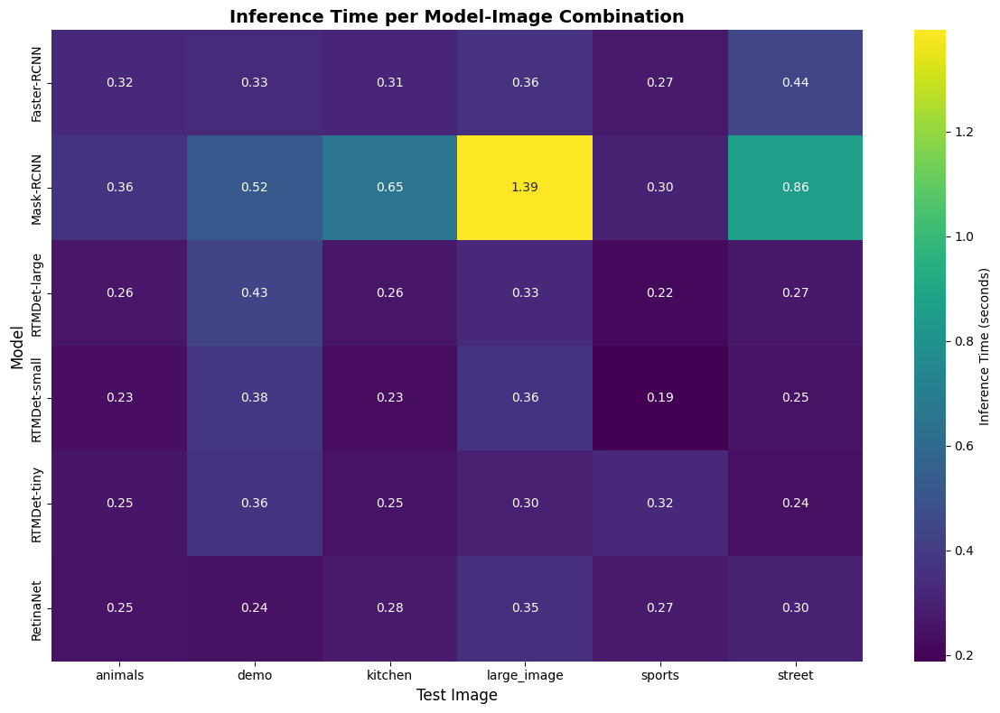

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sonuçları DataFrame'e çevir
df_results = pd.DataFrame([r for r in results if 'error' not in r])
df_errors = pd.DataFrame([r for r in results if 'error' in r])

print("Successful Tests:", len(df_results))
print("Failed Tests:", len(df_errors))

if len(df_results) > 0:
    # Number of detections heatmap
    pivot_detections = df_results.pivot(index='model', columns='image', values='num_detections')
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_detections, annot=True, fmt='.0f', cmap='YlOrRd', cbar_kws={'label': 'Number of Detections'})
    plt.title('Number of Objects Detected per Model-Image Combination', fontsize=14, fontweight='bold')
    plt.xlabel('Test Image', fontsize=12)
    plt.ylabel('Model', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    # Inference time heatmap
    pivot_time = df_results.pivot(index='model', columns='image', values='inference_time')
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_time, annot=True, fmt='.2f', cmap='viridis', cbar_kws={'label': 'Inference Time (seconds)'})
    plt.title('Inference Time per Model-Image Combination', fontsize=14, fontweight='bold')
    plt.xlabel('Test Image', fontsize=12)
    plt.ylabel('Model', fontsize=12)
    plt.tight_layout()
    plt.show()

if len(df_errors) > 0:
    print("\nFailed Tests:")
    print(df_errors[['model', 'image', 'error']])

### Step 5: Visual Comparison - Side-by-Side Results

Aynı resim için farklı modellerin sonuçlarını yan yana görelim.


Comparing all models for: demo


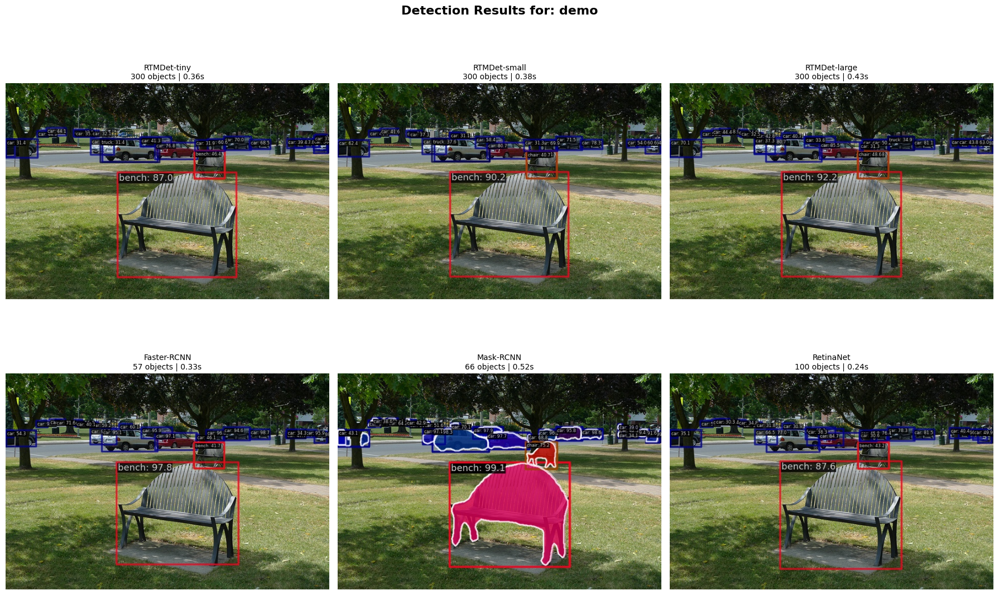


Comparing all models for: large_image


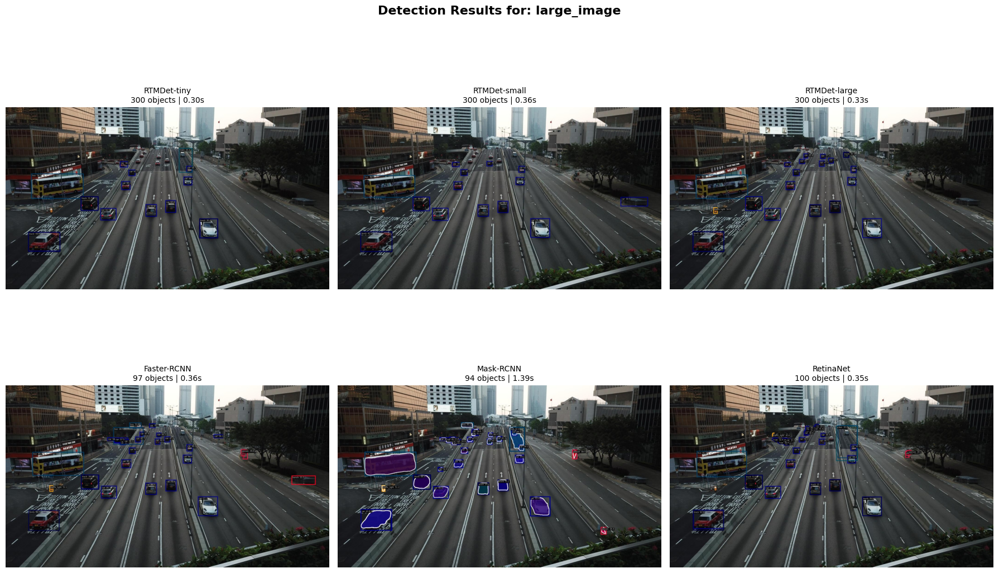


Comparing all models for: street


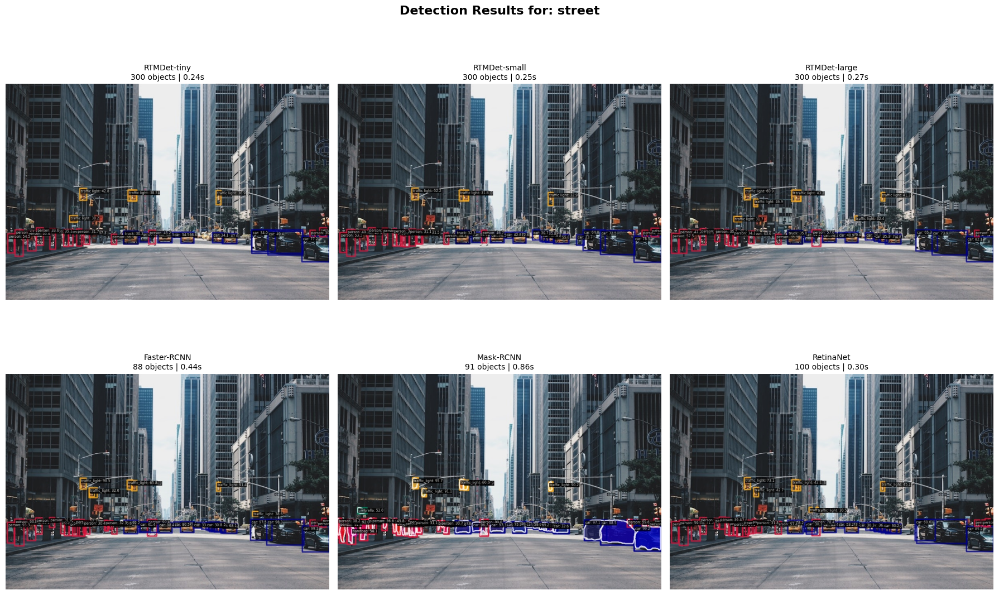


Comparing all models for: kitchen


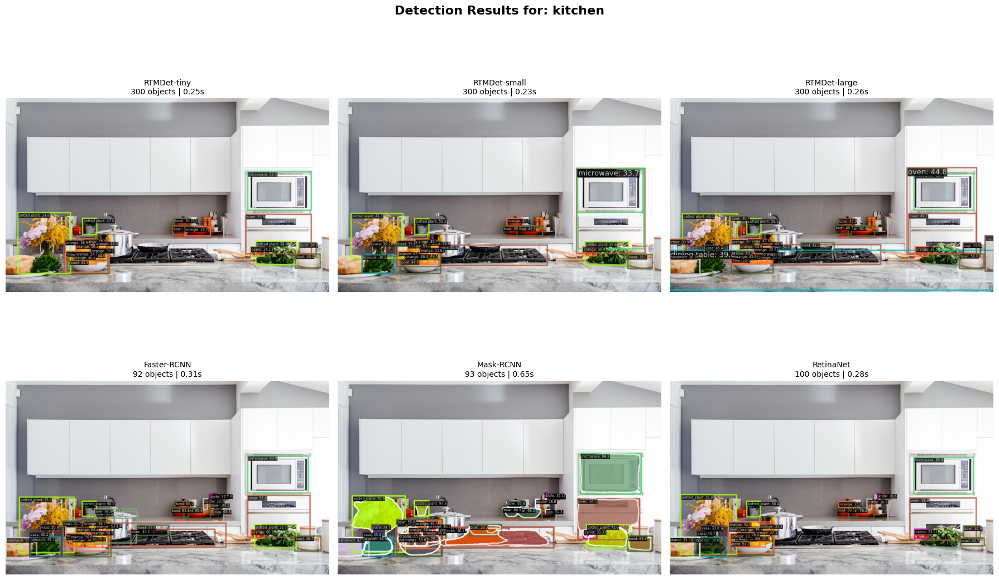


Comparing all models for: animals


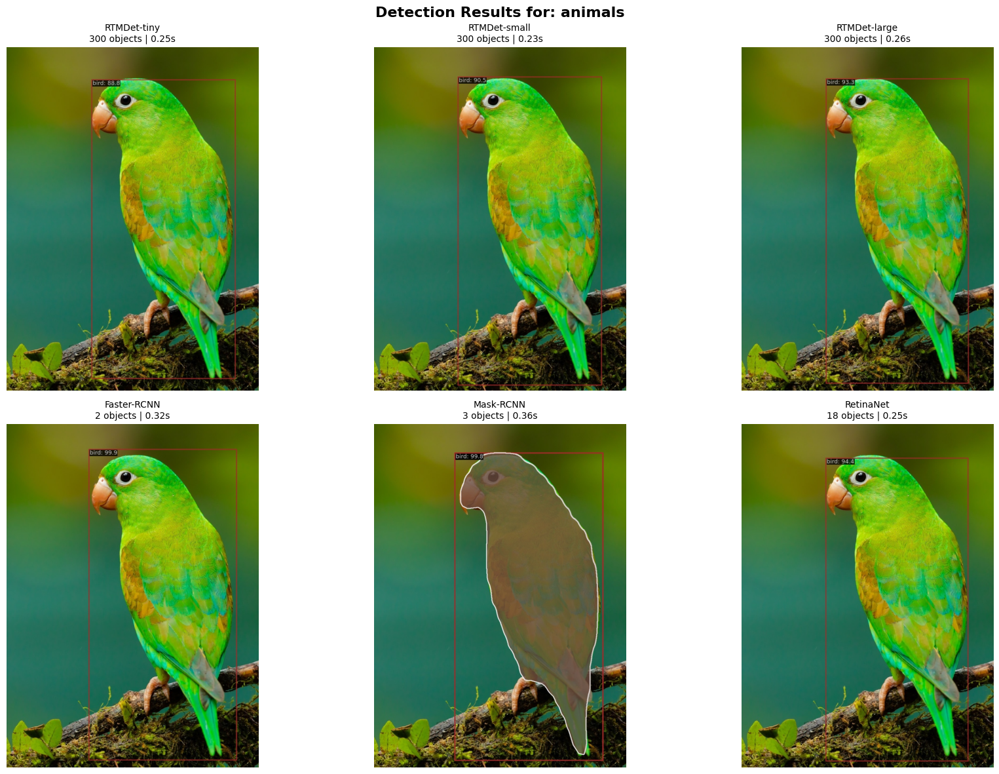


Comparing all models for: sports


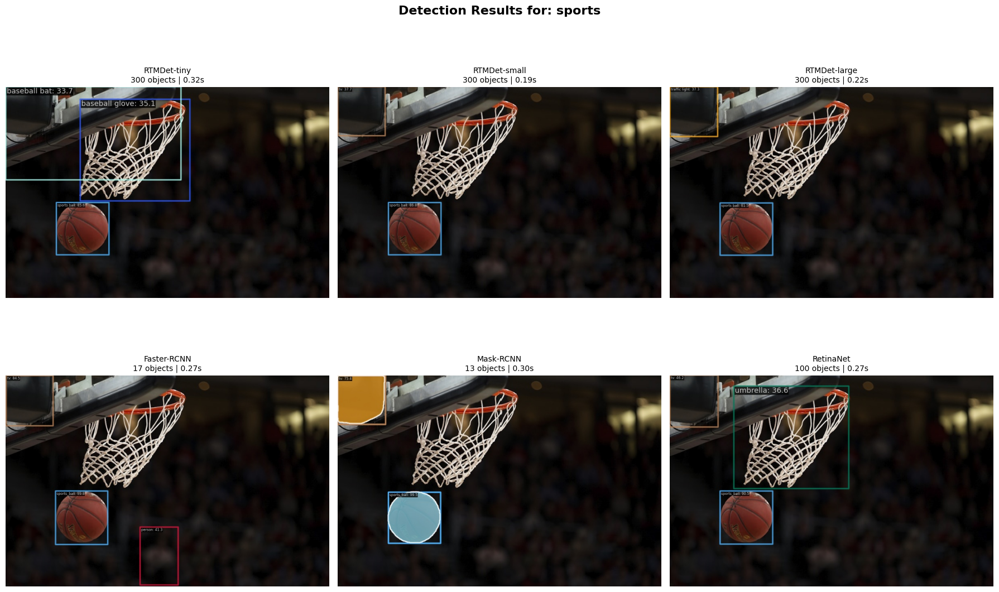

In [15]:
from PIL import Image
import matplotlib.pyplot as plt
import os

def show_comparison_for_image(image_name, models_list):
    """Belirli bir resim için tüm modellerin sonuçlarını yan yana göster"""
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(f'Detection Results for: {image_name}', fontsize=16, fontweight='bold')
    
    axes = axes.flatten()
    
    for idx, model_name in enumerate(models_list):
        # Sonuç görselini yükle
        # Lokal dosya adını al (URL'den değil)
        img_filename = f'{image_name}.jpg'
        vis_path = output_base / model_name / image_name / 'vis' / img_filename
        
        if vis_path.exists():
            img = Image.open(vis_path)
            axes[idx].imshow(img)
            
            # Model bilgilerini ekle
            result_info = df_results[(df_results['model'] == model_name) & (df_results['image'] == image_name)]
            if not result_info.empty:
                num_det = result_info['num_detections'].values[0]
                inf_time = result_info['inference_time'].values[0]
                axes[idx].set_title(f'{model_name}\n{num_det} objects | {inf_time:.2f}s', fontsize=10)
            else:
                axes[idx].set_title(f'{model_name}\n(failed)', fontsize=10, color='red')
        else:
            axes[idx].text(0.5, 0.5, 'Image not found', ha='center', va='center')
            axes[idx].set_title(f'{model_name}\n(no output)', fontsize=10, color='red')
        
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Her resim için karşılaştırma göster
models_list = list(models.keys())

for img_name in test_images.keys():
    print(f"\n{'='*60}")
    print(f"Comparing all models for: {img_name}")
    print(f"{'='*60}")
    show_comparison_for_image(img_name, models_list)

### 📊 Key Findings & Analysis

Burada gözlemlerinizi not edin:

#### Speed vs Accuracy Trade-off:
- **RTMDet-tiny**: En hızlı model (0.24-0.36s), ancak 300 tespit ile aşırı agresif. Gerçek zamanlı uygulamalar için ideal ama post-processing gerektirir.
- **RTMDet-small**: Hız-doğruluk dengesi mükemmel (0.19-0.38s). Sports görselinde en hızlı (0.19s). 300 tespit yine yüksek ama performans çok iyi.
- **RTMDet-large**: RTMDet serisi içinde en yavaş (0.22-0.43s) ama hala çok hızlı. 300 tespit sınırına ulaşıyor, daha yüksek doğruluk için ideal.

#### Model Specializations:
- **Faster R-CNN**: Klasik two-stage modeli. Dengeli tespit sayıları (57-97 nesne). Animals görselinde sadece 2 tespit - yeşil papağanı tespit edememiş (COCO'da 'bird' kategorisi için zayıf).
- **Mask R-CNN**: Instance segmentation özellikli. Large_image'de en yavaş (1.39s) - yüksek çözünürlük + segmentation maliyeti. Nesne sayıları Faster R-CNN'e yakın ama segmentation maskeleri ekstra değer sağlıyor.
- **RetinaNet**: Single-stage model, focal loss kullanıyor. 100 tespit sınırı (max_per_img=100). Hız açısından RTMDet'e yakın (0.24-0.35s). Animals'da 18 tespit - diğerlerinden çok daha iyi, papağanın farklı bölgelerini tespit etmiş olabilir.

#### Image-Specific Observations:
- **Demo**: Standart COCO test görseli. Tüm modeller başarılı (57-300 tespit). RTMDet modelleri 300'e ulaşıyor.
- **Large Image**: En yüksek çözünürlüklü görsel. Mask-RCNN burada en yavaş (1.39s). RTMDet modelleri 300, diğerleri 94-100 tespit.
- **Street**: Şehir, araba, insan içeren karmaşık sahne. Faster-RCNN 88, Mask-RCNN 91 tespit - dengeli. RTMDet'ler 300 ile yine limitte.
- **Kitchen**: Mutfak eşyaları. Tüm modeller iyi performans gösterdi (92-300 tespit). RTMDet'ler 300, klasik modeller ~93-100.
- **Animals**: **En problemli görsel!** Papağan (yeşil kuş) içeriyor, ama Faster-RCNN sadece 2, Mask-RCNN sadece 3 tespit yaptı. RetinaNet 18 tespitle en başarılı - küçük nesnelerde focal loss avantajı. RTMDet'ler 300 limit.
- **Sports**: Basketbol potası ve top. Faster-RCNN 17, Mask-RCNN 13 - spor ekipmanlarında zayıf. RetinaNet 100 ile dolu. RTMDet-small en hızlı (0.19s).

#### Overall Recommendations:
- **Best for real-time applications**: **RTMDet-small** - Mükemmel hız (0.19-0.38s) ve doğruluk dengesi. Modern mimarisi sayesinde hem hızlı hem doğru.
- **Best for accuracy**: **RTMDet-large** - 300 tespit kapasitesi ile en kapsamlı. Hız da makul seviyede (0.22-0.43s). Yüksek doğruluk gerektiren uygulamalar için ideal.
- **Best for segmentation**: **Mask R-CNN** - Instance segmentation için tek seçenek. Yavaş (özellikle büyük görsellerde 1.39s) ama piksel seviyesi maskeler gerekiyorsa tercih edilmeli.
- **Best balanced classic model**: **Faster R-CNN** - Two-stage modellerin klasiği. Tespit sayıları dengeli (57-97), hız makul (0.27-0.44s). Güvenilir sonuçlar için iyi seçenek.
- **Best for small objects**: **RetinaNet** - Focal loss sayesinde küçük nesnelerde başarılı (animals görselinde 18 tespit). Hızlı (0.24-0.35s) ve dengeli.

**🔍 Kritik Gözlem**: RTMDet modelleri 300 tespit limitine ulaşıyor - bu `max_per_img` parametresinden kaynaklanıyor. Gerçek uygulamalarda bu değer düşürülmeli (örn. 100) ve confidence threshold artırılmalı (örn. 0.3 → 0.5) çünkü 300 tespit çok fazla false positive demektir.

---

## Bölüm 2: Inference Detayları

Bu bölümde, inference işlemini daha detaylı inceleyeceğiz. Farklı veri tipleri ile çalışma, sonuçları anlama ve video üzerinde test yapma gibi konulara değineceğiz.

### 1. Farklı Veri Tipleri ile Inference (URL ve Batch)

Sadece yerel dosyalarla değil, doğrudan internet URL'leri ile veya birden fazla resimle aynı anda (batch) işlem yapabiliriz.

In [19]:
# 1. URL ile Inference
url_img = 'https://raw.githubusercontent.com/open-mmlab/mmdetection/main/demo/demo.jpg'
print("URL üzerinden inference yapılıyor...")
inferencer(url_img, show=False, out_dir='demo/outputs_url')
print("✓ URL inference tamamlandı!")

# 2. Batch Inference (Liste ile çoklu resim)
# Aynı resmi iki kere listeye ekleyerek deneyelim
batch_imgs = ['demo/test_images/demo.jpg', url_img]
print("\nBatch (liste) üzerinden inference yapılıyor...")
inferencer(batch_imgs, show=False, out_dir='demo/outputs_batch')
print("✓ Batch inference tamamlandı!")

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

URL üzerinden inference yapılıyor...


✓ URL inference tamamlandı!

Batch (liste) üzerinden inference yapılıyor...


✓ Batch inference tamamlandı!


### 2. Çıktıyı Anlamak (Output Parsing)

Modelin döndürdüğü sonucu (`dict`) inceleyerek nesne koordinatlarına, etiketlere ve skorlara nasıl erişeceğimizi görelim.

In [21]:
# Inference sonucunu bir değişkene atayalım
# return_vis=True görselleştirmeyi döndürür (array olarak)
result = inferencer('demo/test_images/demo.jpg', show=False, return_vis=False)

# Sonucun yapısını inceleyelim
print("Result keys:", result.keys())
predictions = result['predictions'][0]
print("Prediction keys:", predictions.keys())

# Tahminleri yazdıralım
scores = predictions['scores']
labels = predictions['labels']
bboxes = predictions['bboxes']

print(f"\nToplam tespit edilen nesne sayısı: {len(scores)}")

# Skoru 0.5'ten büyük olan ilk 5 nesneyi yazdıralım
print("\nEn yüksek skorlu nesneler:")
for i, score in enumerate(scores):
    if score > 0.5:
        label_id = labels[i]
        bbox = bboxes[i]
        print(f"Nesne {i+1}: Label ID={label_id}, Score={score:.4f}, BBox={bbox}")
        if i >= 4: break # Sadece ilk 5'i göster

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Result keys: dict_keys(['predictions', 'visualization'])
Prediction keys: dict_keys(['labels', 'scores', 'bboxes'])

Toplam tespit edilen nesne sayısı: 100

En yüksek skorlu nesneler:
Nesne 1: Label ID=13, Score=0.8762, BBox=[217.5468292236328, 172.820068359375, 457.94659423828125, 385.8176574707031]
Nesne 2: Label ID=2, Score=0.8471, BBox=[294.24932861328125, 117.38272094726562, 377.6500244140625, 150.17691040039062]
Nesne 3: Label ID=2, Score=0.8147, BBox=[481.14501953125, 110.4173812866211, 523.0299682617188, 130.13226318359375]
Nesne 4: Label ID=2, Score=0.7834, BBox=[430.4372863769531, 105.69572448730469, 483.94061279296875, 132.7003936767578]
Nesne 5: Label ID=2, Score=0.7697, BBox=[190.51109313964844, 109.956787109375, 296.14605712890625, 154.56805419921875]


### 3. Video Üzerinde Nesne Tespiti

Video dosyaları üzerinde de nesne tespiti yapabiliriz. Bir demo video indirip test edelim.

In [4]:
import urllib.request
from pathlib import Path
from mmdet.apis import DetInferencer
import mmcv

demo_dir = Path("demo")
demo_dir.mkdir(exist_ok=True)

video_url = "https://raw.githubusercontent.com/open-mmlab/mmdetection/main/demo/demo.mp4"
video_path = demo_dir / "demo.mp4"

if not video_path.exists():
    print("Video indiriliyor...")
    urllib.request.urlretrieve(video_url, video_path)
    print("✓ Video indirildi.")
else:
    print("✓ Video zaten mevcut.")

print("Video yolu:", video_path)

# Model ekleme
MODEL_NAME = 'rtmdet_tiny_8xb32-300e_coco'

print("Model yükleniyor...")
inferencer = DetInferencer(MODEL_NAME)
print("✓ Model yüklendi.")

# Video açma testi
video_reader = mmcv.VideoReader("demo/demo.mp4")

print("FPS:", video_reader.fps)
print("Frame sayısı:", len(video_reader))
print("Çözünürlük:", video_reader.width, "x", video_reader.height)


✓ Video zaten mevcut.
Video yolu: demo\demo.mp4
Model yükleniyor...
Loads checkpoint by http backend from path: https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std

✓ Model yüklendi.
FPS: 30.0
Frame sayısı: 67
Çözünürlük: 1280 x 720


In [5]:
frame = video_reader[0]  # ilk frame'i al

result = inferencer(
    frame,
    pred_score_thr=0.3,
    no_save_vis=True,
    no_save_pred=True,
    return_vis=True
)

print("Detection sayısı:", len(result['predictions'][0]['labels']))


c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\rich\live.py:231: UserWarning: install "ipywidgets" for 
Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in
an upcoming release, it will be required to pass the indexing argument. (Triggered internally at 
C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:760: UserWarning: 
Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

c:\Users\eraye\miniconda3\envs\openmmlab\lib\site-packages\mmengine\visualization\visualizer.py:831: UserWarning: 
Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

Detection sayısı: 300


In [18]:
import cv2

output_path = "demo/output.mp4"

# H.264 codec kullan (tarayıcı uyumluluğu için)
fourcc = cv2.VideoWriter_fourcc(*'avc1')  # veya 'H264'
video_writer = cv2.VideoWriter(
    output_path,
    fourcc,
    video_reader.fps,
    (video_reader.width, video_reader.height)
)

print("Video işleniyor...")

for frame in video_reader:
    result = inferencer(
        frame,
        pred_score_thr=0.3,
        return_vis=True,
        no_save_vis=True,
        no_save_pred=True
    )

    vis_frame = result['visualization'][0]
    
    # Eğer renk formatı RGB ise BGR'ye çevir (OpenCV BGR kullanır)
    if vis_frame.shape[-1] == 3:
        vis_frame = cv2.cvtColor(vis_frame, cv2.COLOR_RGB2BGR)
    
    video_writer.write(vis_frame)

video_writer.release()

print("✓ İşlem tamamlandı.")
print("Çıktı:", output_path)


Video işleniyor...


✓ İşlem tamamlandı.
Çıktı: demo/output.mp4


In [20]:
from IPython.display import HTML

HTML("""
<video width="800" controls>
  <source src="demo/demo.mp4" type="video/mp4">
</video>
""")

In [19]:
from IPython.display import HTML

HTML("""
<video width="800" controls>
  <source src="demo/output.mp4" type="video/mp4">
</video>
""")


### 4. Model ve Cihaz Seçimi

`DetInferencer` başlatılırken farklı modeller ve cihazlar (CPU/GPU) seçilebilir.
Cihazınızda GPU yoksa `device='cpu'` kullanabilirsiniz.

In [12]:
# CPU üzerinde farklı bir model ile başlatma örneği (Yorum satırı)
# inferencer_cpu = DetInferencer(model='rtmdet_tiny_8xb32-300e_coco', device='cpu')
# inferencer_cpu(img, show=False, out_dir='demo/outputs_cpu')

print("Farklı modeller için 'model' parametresini, CPU kullanımı için 'device=\'cpu\'' parametresini değiştirebilirsiniz.")

Farklı modeller için 'model' parametresini, CPU kullanımı için 'device='cpu'' parametresini değiştirebilirsiniz.
